# NicheCompass - Lung ST 
data from  https://www.nature.com/articles/s12276-022-00896-9#Sec2

Use Environment: py3_9_R4_30

In [56]:
import sys
print("Python Version:", sys.version)

# Check if running inside a Conda environment
import os
if "CONDA_DEFAULT_ENV" in os.environ:
    conda_env_name = os.environ["CONDA_DEFAULT_ENV"]
    print("Active Conda Environment:", conda_env_name)
else:
    print("Not using Conda environment.")

Python Version: 3.9.18 | packaged by conda-forge | (main, Dec 23 2023, 16:36:46) 
[Clang 16.0.6 ]
Active Conda Environment: py3_9_R4_30


## 0. Import packages

In [2]:
import os
import random
import warnings
from datetime import datetime
import gdown
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import squidpy as sq
from matplotlib import gridspec
from sklearn.preprocessing import MinMaxScaler
from scipy.sparse import csr_matrix

/Users/yelin.zhao/opt/anaconda3/envs/py3_9_R4_30/lib/python3.9/site-packages/geopandas/_compat.py:124: UserWarning: The Shapely GEOS version (3.11.3-CAPI-1.17.3) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(
/Users/yelin.zhao/opt/anaconda3/envs/py3_9_R4_30/lib/python3.9/site-packages/spatialdata/__init__.py:11: UserWarning: Geopandas was set to use PyGEOS, changing to shapely 2.0 with:

	geopandas.options.use_pygeos = True

If you intended to use PyGEOS, set the option to False.
  _check_geopandas_using_shapely()


In [3]:
from nichecompass.models import NicheCompass
from nichecompass.utils import (add_gps_from_gp_dict_to_adata,
                                add_multimodal_mask_to_adata,
                                create_new_color_dict,
                                compute_communication_gp_network,
                                visualize_communication_gp_network,
                                extract_gp_dict_from_collectri_tf_network,
                                extract_gp_dict_from_mebocost_es_interactions,
                                extract_gp_dict_from_nichenet_lrt_interactions,
                                extract_gp_dict_from_omnipath_lr_interactions,
                                filter_and_combine_gp_dict_gps,
                                get_gene_annotations,
                                generate_enriched_gp_info_plots,
                                generate_multimodal_mapping_dict,
                                get_unique_genes_from_gp_dict)

/Users/yelin.zhao/opt/anaconda3/envs/py3_9_R4_30/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [4]:
print(pd.__version__)

2.2.1


## Get Adata 
converted from rda

In [142]:
adata_2 = sc.datasets.visium_sge(sample_id='V1_Mouse_Brain_Sagittal_Posterior')
adata_2

AnnData object with n_obs × n_vars = 3355 × 32285
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [143]:
adata = sc.read_h5ad('data/seurat_ST1.h5ad')
adata

AnnData object with n_obs × n_vars = 4095 × 36601
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial'
    var: 'features'

In [144]:
obs = pd.read_csv('data/seurat_ST1_obs.csv', sep = ' ')
obs.columns = ['in_tissue', 'array_row', 'array_col']

In [145]:
adata.obs = obs.copy()

In [146]:
adata.uns = adata_2.uns.copy()

In [147]:
obsm = pd.read_csv('data/seurat_ST1_obsm.csv', sep = ' ')
obsm = np.array(obsm)
obsm_list = list()
for i in range(len(obsm)):
    obsm_list.append([obsm[i][1], obsm[i][0]])
np.array(obsm_list)

adata.obsm['spatial'] = np.array(obsm_list)

In [148]:
imageR = np.array(pd.read_csv('data/seurat_ST1_imageR.csv', sep = ' '))
imageG = np.array(pd.read_csv('data/seurat_ST1_imageG.csv', sep = ' '))
imageB = np.array(pd.read_csv('data/seurat_ST1_imageB.csv', sep = ' '))

image_list3D = list()
for i in range(len(np.array(imageR))):
    image_list2D = list()
    for j in range(len(np.array(imageR)[1])):
        image_list2D.append([imageR[i][j], imageG[i][j], imageB[i][j]])
        
    image_list3D.append(image_list2D)
hires = np.array(image_list3D)

adata.uns['spatial']['V1_Mouse_Brain_Sagittal_Posterior']['images']['hires'] = hires.copy()

In [149]:
spot_diameter = pd.read_csv('data/seurat_ST1_spot_diameter.csv', sep = ' ')
hires_scalef = pd.read_csv('data/seurat_ST1_hires_scalef.csv', sep = ' ')
fiducial_diameter = pd.read_csv('data/seurat_ST1_fiducial_diameter.csv', sep = ' ')

adata.uns['spatial']['V1_Mouse_Brain_Sagittal_Posterior']['scalefactors']['spot_diameter_fullres'] = 150
adata.uns['spatial']['V1_Mouse_Brain_Sagittal_Posterior']['scalefactors']['tissue_hires_scalef'] = hires_scalef['x'][1]
adata.uns['spatial']['V1_Mouse_Brain_Sagittal_Posterior']['scalefactors']['fiducial_diameter_fullres'] = fiducial_diameter['x'][1]


In [150]:
adata.layers['counts']=adata.X.copy().astype('float32')
adata.layers['counts']

<4095x36601 sparse matrix of type '<class 'numpy.float32'>'
	with 15107315 stored elements in Compressed Sparse Row format>

## Preprocess Adata
### QC

In [319]:
adata = sc.read_h5ad('data/seurat_ST1_scanpy.h5ad')
adata.layers['counts']=adata.X.copy().astype('float32')
adata.X = csr_matrix(adata.X)

In [320]:
adata

AnnData object with n_obs × n_vars = 4095 × 36601
    obs: 'in_tissue', 'array_row', 'array_col'
    uns: 'spatial'
    obsm: 'spatial'
    layers: 'counts'

In [321]:
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

<Axes: xlabel='n_genes_by_counts', ylabel='Count'>

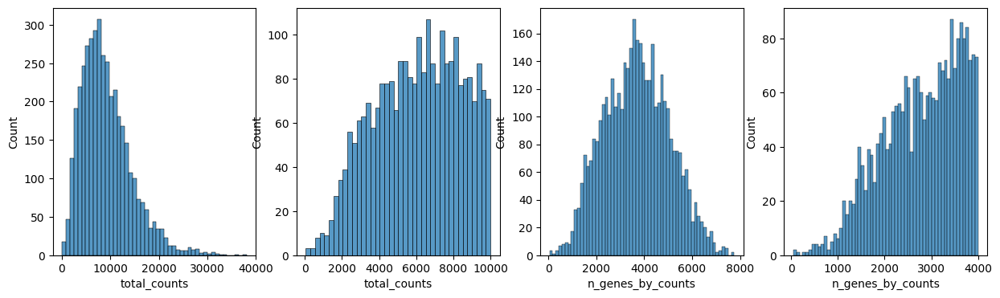

In [322]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.histplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.histplot(
    adata.obs["total_counts"][adata.obs["total_counts"] < 10000],
    kde=False,
    bins=40,
    ax=axs[1],
)
sns.histplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
sns.histplot(
    adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 4000],
    kde=False,
    bins=60,
    ax=axs[3],
)

In [323]:
sc.pp.filter_cells(adata, min_counts=1000)
sc.pp.filter_cells(adata, max_counts=35000)
adata = adata[adata.obs["pct_counts_mt"] < 20].copy()
print(f"#cells after MT filter: {adata.n_obs}")
sc.pp.filter_genes(adata, min_cells=10)

#cells after MT filter: 4073


### Preprocessing

In [325]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)

In [457]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(
    adata, key_added="clusters", directed=False, n_iterations=2,resolution=0.5
)

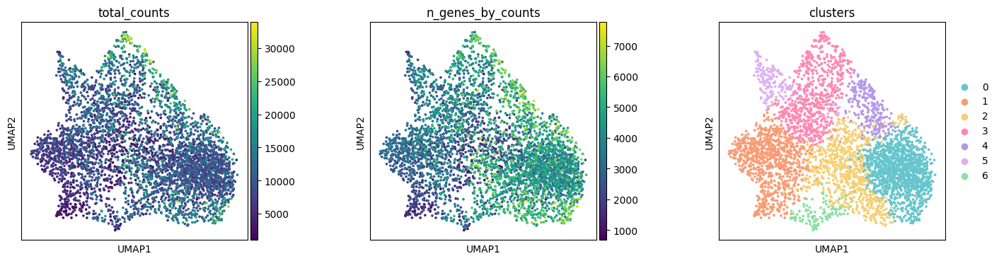

In [458]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata, color=["total_counts", "n_genes_by_counts", "clusters"], wspace=0.4)

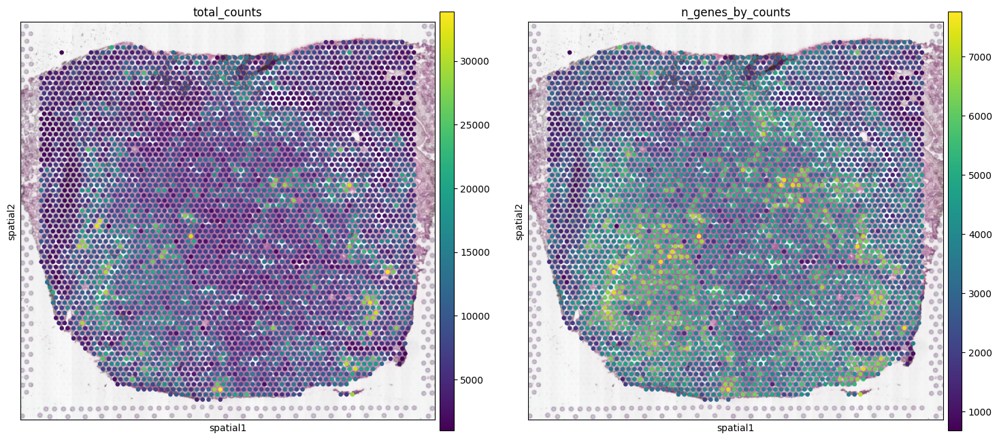

In [459]:
plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.spatial(adata, img_key="hires", color=["total_counts", "n_genes_by_counts"])

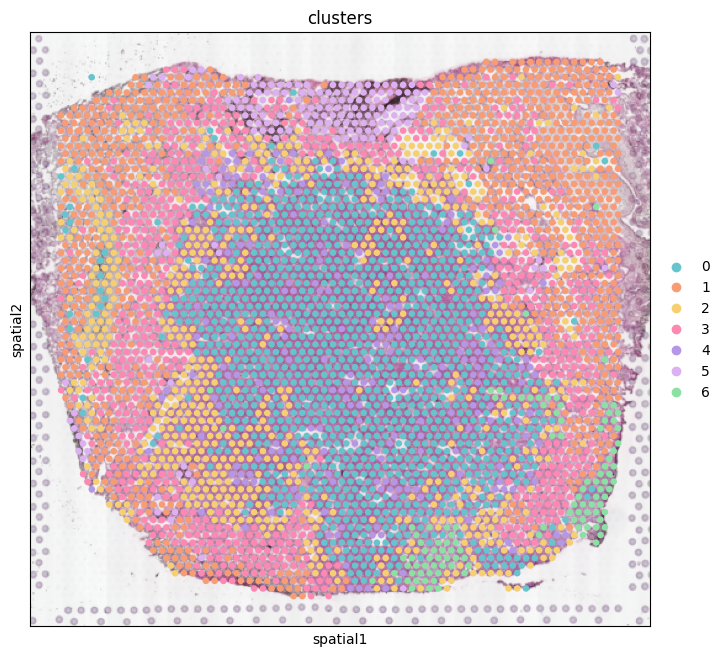

In [460]:
sc.pl.spatial(adata, img_key="hires", color="clusters", size=1)

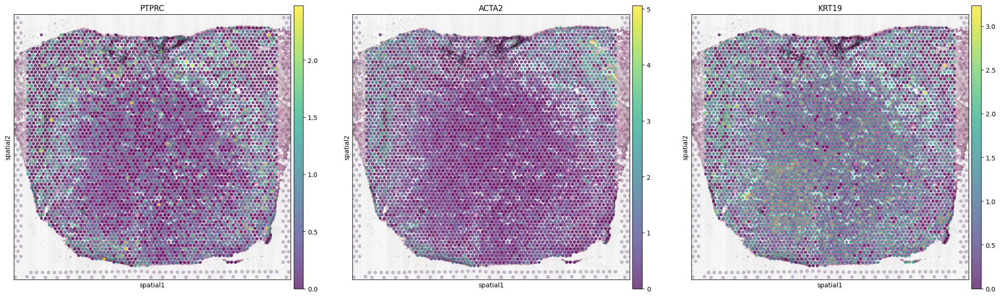

In [463]:
sc.pl.spatial(adata, img_key="hires", color=["PTPRC", "ACTA2","KRT19"], alpha=0.7)

In [330]:
adata

AnnData object with n_obs × n_vars = 4073 × 18502
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'clusters'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'spatial', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'clusters_colors'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

# Start NicheCompass

### 1.2 Define Parameters

In [517]:
### Dataset ###
dataset = "lung_ST" # starmap_plus_mouse_cns
species = "human" 
spatial_key = "spatial"
n_neighbors = 4

### Model ###
# AnnData Keys
counts_key = "counts"
adj_key = "spatial_connectivities"
gp_names_key = "nichecompass_gp_names"
active_gp_names_key = "nichecompass_active_gp_names"
gp_targets_mask_key = "nichecompass_gp_targets"
gp_targets_categories_mask_key = "nichecompass_gp_targets_categories"
gp_sources_mask_key = "nichecompass_gp_sources"
gp_sources_categories_mask_key = "nichecompass_gp_sources_categories"
latent_key = "nichecompass_latent"

# Architecture
conv_layer_encoder = "gcnconv" # change to "gatv2conv" if enough compute and memory
active_gp_thresh_ratio = 0.01

# Trainer
n_epochs = 10
n_epochs_all_gps = 25
lr = 0.001
lambda_edge_recon = 500000.
lambda_gene_expr_recon = 300.
lambda_l1_masked = 0. # increase if gene selection desired
lambda_l1_addon = 100.
edge_batch_size = 1024 # increase if more memory available
n_sampled_neighbors = 4
use_cuda_if_available = True

### Analysis ###
cell_type_key = "clusters" # Main_molecular_cell_type
latent_leiden_resolution = 0.2
latent_cluster_key = f"latent_leiden_{str(latent_leiden_resolution)}"
sample_key = "in_tissue" # batch
spot_size = 0.2
differential_gp_test_results_key = "nichecompass_differential_gp_test_results"

### 1.3 Run Notebook Setup

In [332]:
warnings.filterwarnings("ignore")
# Get time of notebook execution for timestamping saved artifacts
now = datetime.now()
current_timestamp = now.strftime("%d%m%Y_%H%M%S")

### 1.4 Configure Paths

In [333]:
# Define paths
ga_data_folder_path = "data/gene_annotations"
gp_data_folder_path = "data/gene_programs"
so_data_folder_path = "data/spatial_omics"
omnipath_lr_network_file_path = f"{gp_data_folder_path}/omnipath_lr_network.csv"
collectri_tf_network_file_path = f"{gp_data_folder_path}/collectri_tf_network_{species}.csv"
nichenet_lr_network_file_path = f"{gp_data_folder_path}/nichenet_lr_network_v2_{species}.csv"
nichenet_ligand_target_matrix_file_path = f"{gp_data_folder_path}/nichenet_ligand_target_matrix_v2_{species}.csv"
mebocost_enzyme_sensor_interactions_folder_path = f"{gp_data_folder_path}/metabolite_enzyme_sensor_gps"
gene_orthologs_mapping_file_path = f"{ga_data_folder_path}/human_mouse_gene_orthologs.csv"
artifacts_folder_path = f"artifacts"
model_folder_path = f"{artifacts_folder_path}/single_sample/model"
figure_folder_path = f"{artifacts_folder_path}/single_sample/figures"

In [334]:
f"{ga_data_folder_path}/human_mouse_gene_orthologs.csv"

'data/gene_annotations/human_mouse_gene_orthologs.csv'

### 1.5 Create Directories

In [335]:
os.makedirs(model_folder_path, exist_ok=True)
os.makedirs(figure_folder_path, exist_ok=True)
os.makedirs(so_data_folder_path, exist_ok=True)

### 1.6 Download the files used in this tutorial (optional)

In [336]:
'''
gdown.download('https://drive.google.com/uc?id=1MOjIyue7a-JDAcnAseqIljDyoO7KtH99', so_data_folder_path+'/starmap_plus_mouse_cns_batch1.h5ad')
'''

"\ngdown.download('https://drive.google.com/uc?id=1MOjIyue7a-JDAcnAseqIljDyoO7KtH99', so_data_folder_path+'/starmap_plus_mouse_cns_batch1.h5ad')\n"

## 2. Prepare Model Training
### 2.1 Create Prior Knowledge Gene Program (GP) Mask
NicheCompass expects a prior GP mask as input, which it will use to make its latent feature space interpretable (through linear masked decoders).

The user can provide a custom GP mask to NicheCompass based on the biological question of interest.

As a default, here we create a GP mask based on three databases of prior knowledge of inter- and intracellular interaction pathways:

OmniPath (Ligand-Receptor GPs)

MEBOCOST (Enzyme-Sensor GPs)

NicheNet (Combined Interaction GPs)

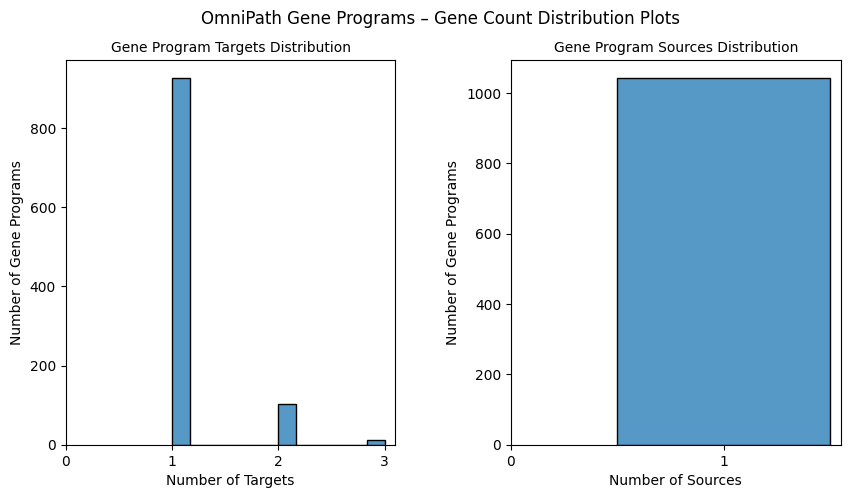

In [337]:
# Retrieve OmniPath GPs (source: ligand genes; target: receptor genes)
omnipath_gp_dict = extract_gp_dict_from_omnipath_lr_interactions(
    species=species,
    min_curation_effort=0,
    load_from_disk=False,
    save_to_disk=True,
    lr_network_file_path=omnipath_lr_network_file_path,
    gene_orthologs_mapping_file_path=gene_orthologs_mapping_file_path,
    plot_gp_gene_count_distributions=True,
    gp_gene_count_distributions_save_path=f"{figure_folder_path}" \
                                           "/omnipath_gp_gene_count_distributions.svg")

In [338]:
# Display example OmniPath GP
omnipath_gp_names = list(omnipath_gp_dict.keys())
random.shuffle(omnipath_gp_names)
omnipath_gp_name = omnipath_gp_names[0]
print(f"{omnipath_gp_name}: {omnipath_gp_dict[omnipath_gp_name]}")

GIP_ligand_receptor_GP: {'sources': ['GIP'], 'targets': ['ADRB3'], 'sources_categories': ['ligand'], 'targets_categories': ['receptor']}


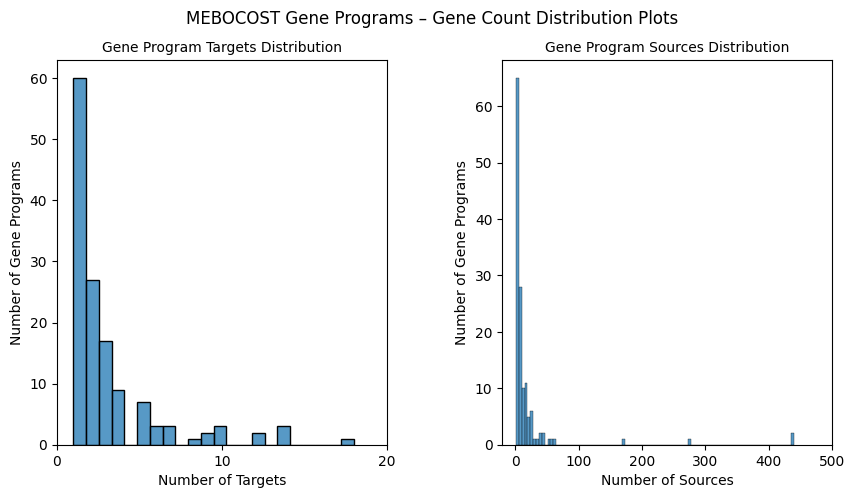

In [339]:
# Retrieve MEBOCOST GPs (source: enzyme genes; target: sensor genes)
mebocost_gp_dict = extract_gp_dict_from_mebocost_es_interactions(
    dir_path=mebocost_enzyme_sensor_interactions_folder_path,
    species=species,
    plot_gp_gene_count_distributions=True)

In [25]:
# Display example MEBOCOST GP
mebocost_gp_names = list(mebocost_gp_dict.keys())
random.shuffle(mebocost_gp_names)
mebocost_gp_name = mebocost_gp_names[0]
print(f"{mebocost_gp_name}: {mebocost_gp_dict[mebocost_gp_name]}")

Hypoxanthine_metabolite_enzyme_sensor_GP: {'sources': ['HPRT1', 'PNP', 'XDH'], 'sources_categories': ['enzyme', 'enzyme', 'enzyme'], 'targets': ['SLC29A2'], 'targets_categories': ['sensor']}


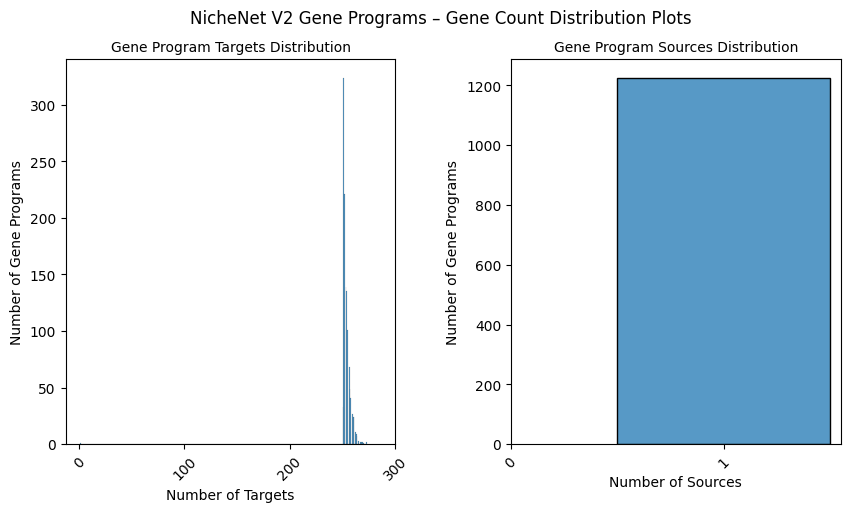

In [26]:
# Retrieve NicheNet GPs (source: ligand genes; target: receptor genes, target genes)
nichenet_gp_dict = extract_gp_dict_from_nichenet_lrt_interactions(
    species=species,
    version="v2",
    keep_target_genes_ratio=1.,
    max_n_target_genes_per_gp=250,
    load_from_disk=False,
    save_to_disk=True,
    lr_network_file_path=nichenet_lr_network_file_path,
    ligand_target_matrix_file_path=nichenet_ligand_target_matrix_file_path,
    gene_orthologs_mapping_file_path=gene_orthologs_mapping_file_path,
    plot_gp_gene_count_distributions=True)

In [27]:
# Display example NicheNet GP
nichenet_gp_names = list(nichenet_gp_dict.keys())
random.shuffle(nichenet_gp_names)
nichenet_gp_name = nichenet_gp_names[0]
print(f"{nichenet_gp_name}: {nichenet_gp_dict[nichenet_gp_name]}")

CDCP1_ligand_receptor_target_gene_GP: {'sources': ['CDCP1'], 'targets': ['EGFR', 'A2M', 'ABCC3', 'ACKR3', 'ADD3', 'ADM', 'AHNAK', 'AKT1', 'ANGPTL4', 'ANKRD1', 'APP', 'ARID5B', 'ASCL1', 'ASPH', 'ASS1', 'ATF3', 'BAX', 'BCL2', 'BCL2L1', 'BCL2L11', 'BCL3', 'BCL6', 'BDNF', 'BHLHE40', 'BIRC3', 'BIRC5', 'BMP4', 'BRCA1', 'BST2', 'BTG1', 'CAV1', 'CBX5', 'CCL2', 'CCL5', 'CCN1', 'CCN2', 'CCNA2', 'CCNB1', 'CCND1', 'CCND2', 'CCND3', 'CD44', 'CD83', 'CDH1', 'CDH3', 'CDK4', 'CDK6', 'CDKN1A', 'CDKN2A', 'CEACAM1', 'CEBPA', 'CEBPD', 'CEMIP', 'CEMIP2', 'CITED2', 'CKS1B', 'CLDN1', 'COL1A2', 'CSF2', 'CSGALNACT1', 'CTSH', 'CXADR', 'CXCL2', 'CXCL8', 'CXCR4', 'CYP1A1', 'CYP1B1', 'CYP27B1', 'DDIT3', 'DDIT4', 'DDX60', 'DHRS3', 'DKK1', 'DTL', 'DUSP1', 'DUSP4', 'DUSP5', 'DUSP6', 'EDN1', 'EFHD1', 'EFNA1', 'EGLN3', 'EGR1', 'EGR2', 'EGR3', 'ELF3', 'EMP1', 'EPAS1', 'EPHA2', 'ESR1', 'ETS1', 'ETS2', 'EZH2', 'FAS', 'FASN', 'FGF2', 'FN1', 'FOS', 'FOSL1', 'FOXO3', 'FST', 'GADD45A', 'GADD45B', 'GATA3', 'GBP2', 'GDF15', 'GF

In [28]:
# Add GPs into one combined dictionary for model training
combined_gp_dict = dict(omnipath_gp_dict)
combined_gp_dict.update(mebocost_gp_dict)
combined_gp_dict.update(nichenet_gp_dict)

In [29]:
# Filter and combine GPs to avoid overlaps
combined_new_gp_dict = filter_and_combine_gp_dict_gps(
    gp_dict=combined_gp_dict,
    gp_filter_mode="subset",
    combine_overlap_gps=True,
    overlap_thresh_source_genes=0.9,
    overlap_thresh_target_genes=0.9,
    overlap_thresh_genes=0.9)

print("Number of gene programs before filtering and combining: "
      f"{len(combined_gp_dict)}.")
print(f"Number of gene programs after filtering and combining: "
      f"{len(combined_new_gp_dict)}.")

Number of gene programs before filtering and combining: 2406.
Number of gene programs after filtering and combining: 1987.


### 2.2 Load Data & Compute Spatial Neighbor Graph
NicheCompass expects a precomputed spatial adjacency matrix stored in ‘adata.obsp[adj_key]’.

The user can customize the spatial neighbor graph construction based on the biological question of interest.

In [167]:
adata

AnnData object with n_obs × n_vars = 4073 × 18502
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'clusters'
    var: 'features', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'spatial', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'clusters_colors'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [168]:
# This is the example data
# Read data
adata_example = sc.read_h5ad(
        f"{so_data_folder_path}/starmap_plus_mouse_cns_batch1.h5ad")
adata_example

AnnData object with n_obs × n_vars = 91246 × 1022
    obs: 'Main_molecular_cell_type', 'Sub_molecular_cell_type', 'Main_molecular_tissue_region', 'Sub_molecular_tissue_region', 'Molecular_spatial_cell_type', 'batch'
    uns: 'log1p'
    obsm: 'spatial'
    layers: 'counts'

In [535]:
adata_example.layers['counts'].todense()

matrix([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 3., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 1., 0.]], dtype=float32)

In [340]:
# Compute spatial neighborhood
sq.gr.spatial_neighbors(adata,
                        coord_type="generic",
                        spatial_key=spatial_key,
                        n_neighs=n_neighbors)

# Make adjacency matrix symmetric
adata.obsp[adj_key] = (
    adata.obsp[adj_key].maximum(
        adata.obsp[adj_key].T))

### 2.3 Add GP Mask to Data

In [341]:
# Add the GP dictionary as binary masks to the adata
add_gps_from_gp_dict_to_adata(
    gp_dict=combined_new_gp_dict,
    adata=adata,
    gp_targets_mask_key=gp_targets_mask_key,
    gp_targets_categories_mask_key=gp_targets_categories_mask_key,
    gp_sources_mask_key=gp_sources_mask_key,
    gp_sources_categories_mask_key=gp_sources_categories_mask_key,
    gp_names_key=gp_names_key,
    min_genes_per_gp=2,
    min_source_genes_per_gp=1,
    min_target_genes_per_gp=1,
    max_genes_per_gp=None,
    max_source_genes_per_gp=None,
    max_target_genes_per_gp=None)

### 2.4 Explore Data

In [342]:
cell_type_colors = create_new_color_dict(
    adata=adata,
    cat_key=cell_type_key)

In [343]:
adata

AnnData object with n_obs × n_vars = 4073 × 18502
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'clusters'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'spatial', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'clusters_colors', 'spatial_neighbors', 'nichecompass_sources_categories_label_encoder', 'nichecompass_targets_categories_label_encoder', 'nichecompass_source_genes_idx', 'nichecompass_target_genes_idx', 'nichecompass_genes_idx', 'nichecompass_gp_names'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs', 'nichecompass_gp_

In [344]:
print(f"Number of nodes (observations): {adata.layers['counts'].shape[0]}")
print(f"Number of node features (genes): {adata.layers['counts'].shape[1]}")

Number of nodes (observations): 4073
Number of node features (genes): 18502


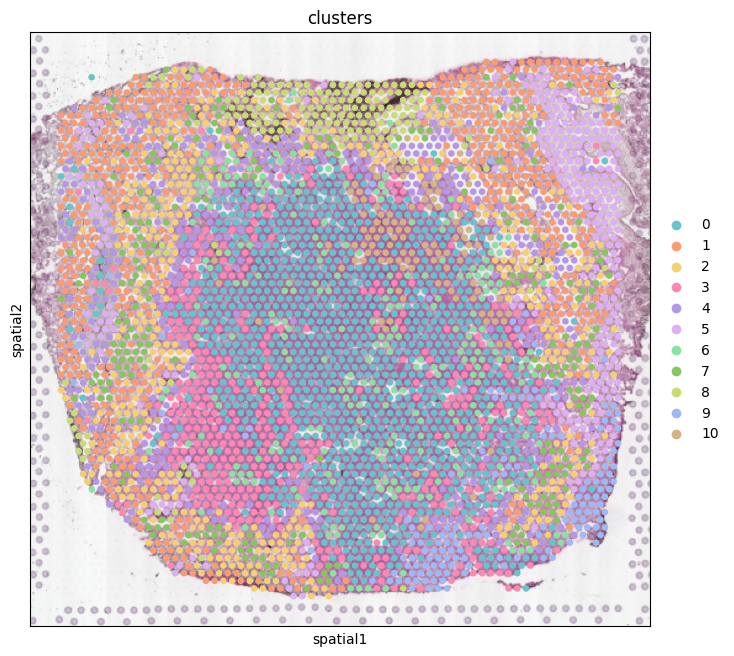

In [345]:
# Visualize cell-level annotated data in physical space
sc.pl.spatial(adata,
              color=cell_type_key, #cell_type_key
              palette=cell_type_colors,
              img_key="hires",size = 1)  

## 3. Train Model
### 3.1 Initialize, Train & Save Model

In [350]:
print(gp_sources_mask_key)
print(adata)

nichecompass_gp_sources
AnnData object with n_obs × n_vars = 4073 × 18502
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'clusters'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'spatial', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'clusters_colors', 'spatial_neighbors', 'nichecompass_sources_categories_label_encoder', 'nichecompass_targets_categories_label_encoder', 'nichecompass_source_genes_idx', 'nichecompass_target_genes_idx', 'nichecompass_genes_idx', 'nichecompass_gp_names'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 

In [467]:
# Initialize model
model = NicheCompass(adata,
                     counts_key=counts_key,
                     adj_key=adj_key,
                     gp_names_key=gp_names_key,
                     active_gp_names_key=active_gp_names_key,
                     gp_targets_mask_key=gp_targets_mask_key,
                     gp_targets_categories_mask_key=gp_targets_categories_mask_key,
                     gp_sources_mask_key=gp_sources_mask_key,
                     gp_sources_categories_mask_key=gp_sources_categories_mask_key,
                     latent_key=latent_key,
                     conv_layer_encoder=conv_layer_encoder,
                     active_gp_thresh_ratio=active_gp_thresh_ratio)

--- INITIALIZING NEW NETWORK MODULE: VARIATIONAL GENE PROGRAM GRAPH AUTOENCODER ---
LOSS -> include_edge_recon_loss: True, include_gene_expr_recon_loss: True, rna_recon_loss: nb
NODE LABEL METHOD -> one-hop-norm
ACTIVE GP THRESHOLD RATIO -> 0.01
LOG VARIATIONAL -> True
ONE HOP GCN NORM RNA NODE LABEL AGGREGATOR
ENCODER -> n_input: 18502, n_cat_covariates_embed_input: 0, n_hidden: 1454, n_latent: 1354, n_addon_latent: 100, n_fc_layers: 1, n_layers: 1, conv_layer: gcnconv, n_attention_heads: 0, dropout_rate: 0.0, 
COSINE SIM GRAPH DECODER -> dropout_rate: 0.0
MASKED TARGET RNA DECODER -> n_prior_gp_input: 1354, n_addon_gp_input: 100, n_cat_covariates_embed_input: 0, n_output: 18502
MASKED SOURCE RNA DECODER -> n_prior_gp_input: 1354, n_addon_gp_input: 100, n_cat_covariates_embed_input: 0, n_output: 18502


In [468]:
n_epochs = 40

In [469]:
# Train model
model.train(n_epochs=n_epochs,
            n_epochs_all_gps=n_epochs_all_gps,
            lr=lr,
            lambda_edge_recon=lambda_edge_recon,
            lambda_gene_expr_recon=lambda_gene_expr_recon,
            lambda_l1_masked=lambda_l1_masked,
            edge_batch_size=edge_batch_size,
            n_sampled_neighbors=n_sampled_neighbors,
            use_cuda_if_available=use_cuda_if_available,
            verbose=False)


--- INITIALIZING TRAINER ---
Number of training nodes: 3666
Number of validation nodes: 407
Number of training edges: 8994
Number of validation edges: 999
Edge batch size: 1024
Node batch size: None

--- MODEL TRAINING ---
Epoch 1/40 |--------------------| 2.5% train_global_loss: 7095817642038.5557; train_optim_loss: 7095817642038.5557; val_global_loss: 16496201.0000; val_optim_loss: 16496201.0000
Epoch 2/40 |█-------------------| 5.0% train_global_loss: 76762633.8889; train_optim_loss: 76762633.8889; val_global_loss: 12790824.0000; val_optim_loss: 12790824.0000
Epoch 3/40 |█-------------------| 7.5% train_global_loss: 118450379.6667; train_optim_loss: 118450379.6667; val_global_loss: 45972480.0000; val_optim_loss: 45972480.0000
Epoch 4/40 |██------------------| 10.0% train_global_loss: 97795251.1111; train_optim_loss: 97795251.1111; val_global_loss: 13829383.0000; val_optim_loss: 13829383.0000
Epoch 5/40 |██------------------| 12.5% train_global_loss: 253907307.3333; train_optim_loss

In [539]:
# Compute latent neighbor graph
sc.pp.neighbors(model.adata,
                use_rep=latent_key,
                key_added=latent_key)

# Compute UMAP embedding
sc.tl.umap(model.adata,
           neighbors_key=latent_key)

TypeError: tsne() got an unexpected keyword argument 'use_wrep'

In [540]:
sc.tl.tsne(model.adata,
           use_rep=latent_key)

In [530]:
model_folder_path
model.adata

AnnData object with n_obs × n_vars = 4073 × 18502
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'clusters', 'latent_leiden_0.4', 'Add-on_76_GP', 'Add-on_63_GP', 'Add-on_81_GP', 'Add-on_88_GP', 'Add-on_40_GP', 'Add-on_42_GP', 'ICOSLG_ligand_receptor_target_gene_GP', 'Add-on_96_GP', 'SDC2_ligand_receptor_GP', 'CLEC2D_ligand_receptor_target_gene_GP', 'Add-on_37_GP', 'Add-on_34_GP', 'Add-on_0_GP', 'TNC_ligand_receptor_GP', 'Add-on_86_GP', 'VCAN_ligand_receptor_target_gene_GP', 'VEGFC_ligand_receptor_GP', 'ARF4_ligand_receptor_GP', 'Betaine_metabolite_enzyme_sensor_GP', 'FGF2_ligand_receptor_GP', 'Add-on_21_GP', 'CXCL10_ligand_receptor_GP', 'CDH15_ligand_receptor_target_gene_GP', 'VCL_ligand_receptor_GP', 'Add-o

In [472]:
# Save trained model
model.save(dir_path=model_folder_path,
           overwrite=True,
           save_adata=True,
           adata_file_name="adata.h5ad")

## 4. Analysis

In [473]:
#load_timestamp = "09022024_180928"
# load_timestamp = current_timestamp # uncomment if you trained the model in this notebook

#figure_folder_path = f"{artifacts_folder_path}/single_sample/{load_timestamp}/figures"
#model_folder_path = f"{artifacts_folder_path}/single_sample/{load_timestamp}/model"

figure_folder_path = f"/Users/yelin.zhao/Library/CloudStorage/OneDrive-Personal/Projects/Spatial/Spatial_CCC/artifacts/single_sample/figures"
model_folder_path = f"/Users/yelin.zhao/Library/CloudStorage/OneDrive-Personal/Projects/Spatial/Spatial_CCC/artifacts/single_sample/model"


os.makedirs(figure_folder_path, exist_ok=True)

In [474]:
# Load trained model
model = NicheCompass.load(dir_path=model_folder_path,
                          adata=None,
                          adata_file_name="adata.h5ad",
                          gp_names_key=gp_names_key)

--- INITIALIZING NEW NETWORK MODULE: VARIATIONAL GENE PROGRAM GRAPH AUTOENCODER ---
LOSS -> include_edge_recon_loss: True, include_gene_expr_recon_loss: True, rna_recon_loss: nb
NODE LABEL METHOD -> one-hop-norm
ACTIVE GP THRESHOLD RATIO -> 0.01
LOG VARIATIONAL -> True
ONE HOP GCN NORM RNA NODE LABEL AGGREGATOR
ENCODER -> n_input: 18502, n_cat_covariates_embed_input: 0, n_hidden: 1454, n_latent: 1354, n_addon_latent: 100, n_fc_layers: 1, n_layers: 1, conv_layer: gcnconv, n_attention_heads: 0, dropout_rate: 0.0, 
COSINE SIM GRAPH DECODER -> dropout_rate: 0.0
MASKED TARGET RNA DECODER -> n_prior_gp_input: 1354, n_addon_gp_input: 100, n_cat_covariates_embed_input: 0, n_output: 18502
MASKED SOURCE RNA DECODER -> n_prior_gp_input: 1354, n_addon_gp_input: 100, n_cat_covariates_embed_input: 0, n_output: 18502


In [475]:
samples = [1]
#samples = model.adata.obs[sample_key].unique().tolist()
samples

[1]

In [476]:
sample_key

'in_tissue'

### 4.1 Visualize NicheCompass Latent GP Space

In [477]:
cell_type_colors = create_new_color_dict(
    adata=model.adata,
    cat_key=cell_type_key)

In [478]:
enumerate(samples)

In [529]:
cell_type_key

'clusters'

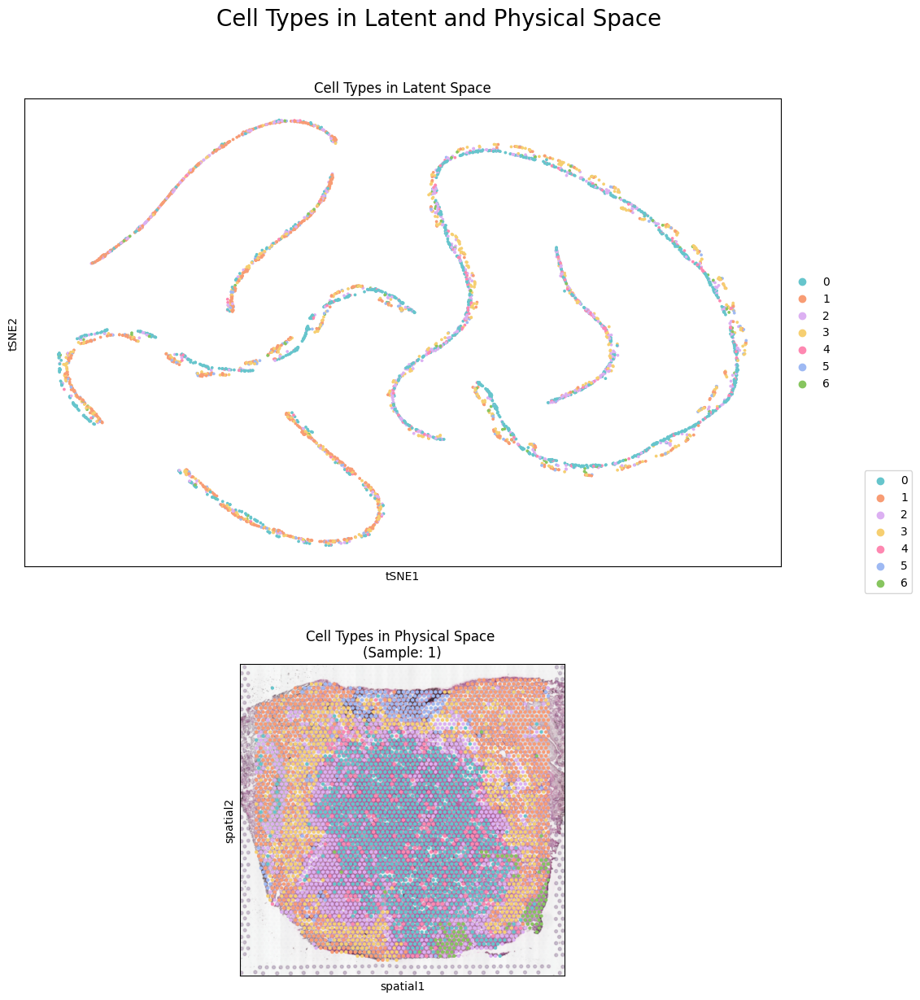

In [546]:
# Create plot of cell type annotations in physical and latent space
groups = None
save_fig = True
file_path = f"{figure_folder_path}/" \
            "cell_types_latent_physical_space.svg"

fig = plt.figure(figsize=(12, 14))
title = fig.suptitle(t=f"Cell Types " \
                       "in Latent and Physical Space",
                     y=0.96,
                     x=0.55,
                     fontsize=20)
spec1 = gridspec.GridSpec(ncols=1,
                          nrows=2,
                          width_ratios=[1],
                          height_ratios=[3, 2])
spec2 = gridspec.GridSpec(ncols=len(samples),
                          nrows=2,
                          width_ratios=[1] * len(samples),
                          height_ratios=[3, 2])
axs = []
axs.append(fig.add_subplot(spec1[0]))

sc.pl.umap(adata=model.adata,
           color=[cell_type_key],
           groups=groups,palette=cell_type_colors,
           title=f"Cell Types in Latent Space",
           ax=axs[0],
           show=False)

for idx, sample in enumerate(samples):
    axs.append(fig.add_subplot(spec2[len(samples) + idx]))
    sc.pl.spatial(adata=model.adata[model.adata.obs[sample_key] == sample], # sample_key
                  color=[cell_type_key],
                  groups=groups,
                  palette=cell_type_colors,
                  #spot_size=spot_size,
                  title=f"Cell Types in Physical Space \n"
                        f"(Sample: {sample})",
                  legend_loc=None,
                  ax=axs[idx+1],
                  show=False)

# Create and position shared legend
handles, labels = axs[0].get_legend_handles_labels()
lgd = fig.legend(handles,
                 labels,
                 loc="center left",
                 bbox_to_anchor=(0.98, 0.5))
#axs[0].get_legend().remove()

# Adjust, save and display plot
plt.subplots_adjust(wspace=0.2, hspace=0.25)
if save_fig:
    fig.savefig(file_path,
                bbox_extra_artists=(lgd, title),
                bbox_inches="tight")
plt.show()

In [545]:
sc.pl.tsne(adata=model.adata,
           color=[cell_type_key],
           groups=groups,palette=cell_type_colors,
           title=f"Cell Types in Latent Space",
           ax=axs[0],
           show=True)


In [480]:
sample

1

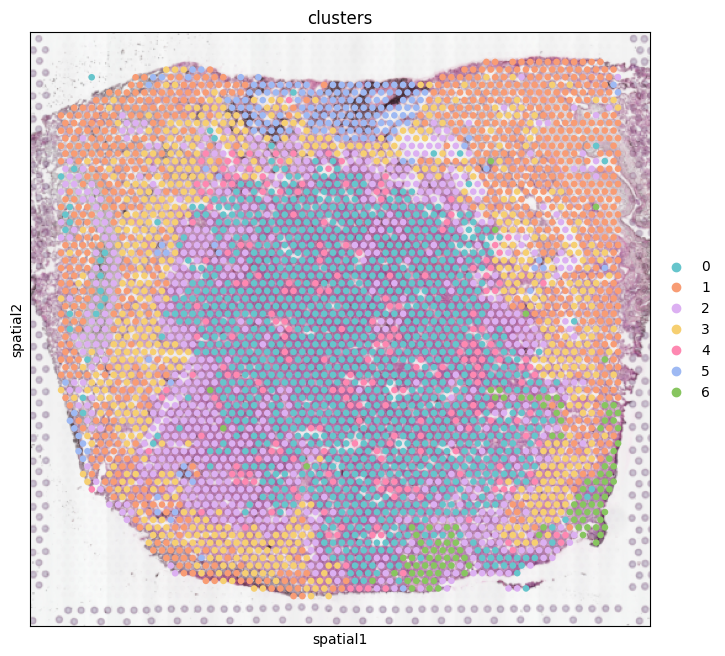

In [481]:
sc.pl.spatial(adata=model.adata[model.adata.obs[sample_key] == sample], img_key="hires", color="clusters", size=1)

### 4.2 Identify Niches

In [519]:
# Compute latent Leiden clustering
sc.tl.leiden(adata=model.adata,
             resolution=latent_leiden_resolution,
             key_added=latent_cluster_key,
             neighbors_key=latent_key)

In [520]:
latent_cluster_colors = create_new_color_dict(
    adata=model.adata,
    cat_key=latent_cluster_key)

In [521]:
adata

AnnData object with n_obs × n_vars = 4073 × 18502
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'clusters'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'spatial', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'clusters_colors', 'spatial_neighbors', 'nichecompass_sources_categories_label_encoder', 'nichecompass_targets_categories_label_encoder', 'nichecompass_source_genes_idx', 'nichecompass_target_genes_idx', 'nichecompass_genes_idx', 'nichecompass_gp_names', 'nichecompass_active_gp_names', 'nichecompass_latent'
    obsm: 'spatial

In [522]:
latent_cluster_key

'latent_leiden_0.2'

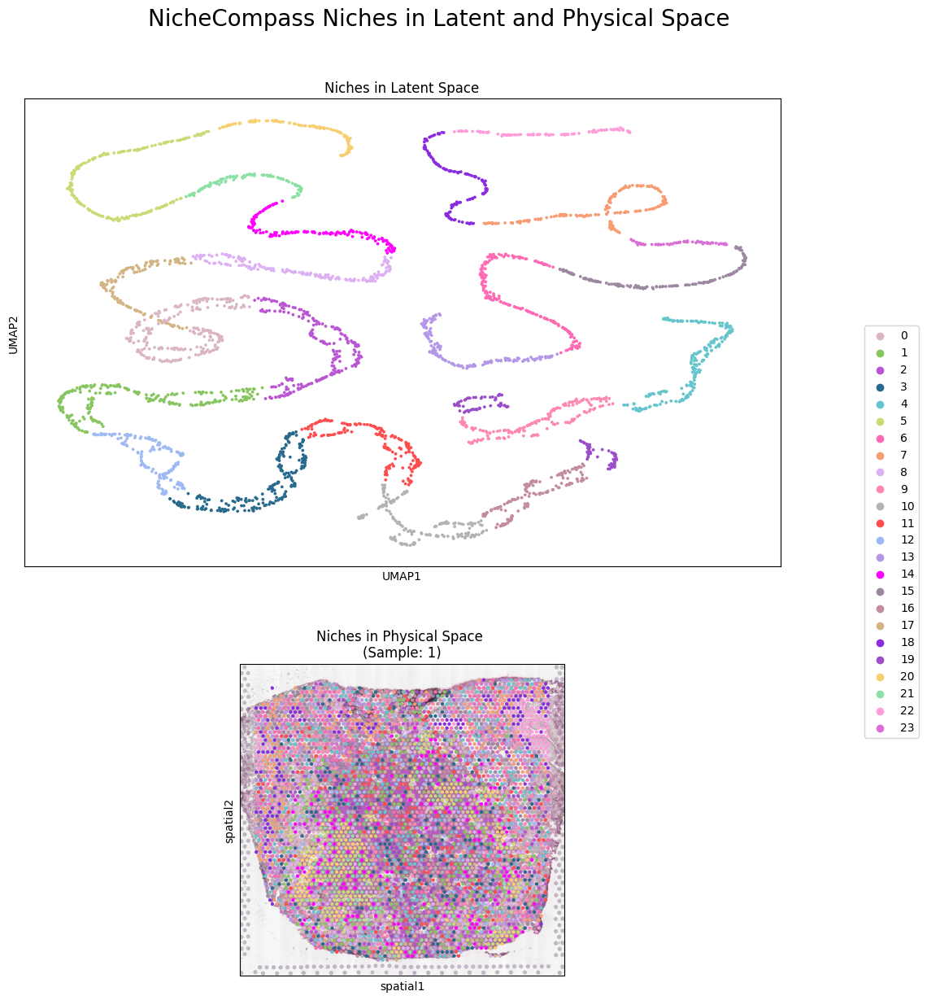

In [523]:
# Create plot of latent cluster / niche annotations in physical and latent space
groups = None # set this to a specific cluster for easy visualization, e.g. ["17"]
save_fig = True
file_path = f"{figure_folder_path}/" \
            f"res_{latent_leiden_resolution}_" \
            "niches_latent_physical_space.svg"

fig = plt.figure(figsize=(12, 14))
title = fig.suptitle(t=f"NicheCompass Niches " \
                       "in Latent and Physical Space",
                     y=0.96,
                     x=0.55,
                     fontsize=20)
spec1 = gridspec.GridSpec(ncols=1,
                          nrows=2,
                          width_ratios=[1],
                          height_ratios=[3, 2])
spec2 = gridspec.GridSpec(ncols=len(samples),
                          nrows=2,
                          width_ratios=[1] * len(samples),
                          height_ratios=[3, 2])
axs = []
axs.append(fig.add_subplot(spec1[0]))
sc.pl.umap(adata=model.adata,
           color=[latent_cluster_key],
           groups=groups,
           palette=latent_cluster_colors,
           title=f"Niches in Latent Space",
           ax=axs[0],
           show=False)

for idx, sample in enumerate(samples):
    axs.append(fig.add_subplot(spec2[len(samples) + idx]))
    sc.pl.spatial(adata=model.adata[model.adata.obs['in_tissue'] == sample],# sample_key
                  color=[latent_cluster_key],
                  groups=groups,
                  palette=latent_cluster_colors,
                  #spot_size=spot_size,
                  title=f"Niches in Physical Space \n"
                        f"(Sample: {sample})",
                  legend_loc=None,
                  ax=axs[idx+1],
                  show=False)

# Create and position shared legend
handles, labels = axs[0].get_legend_handles_labels()
lgd = fig.legend(handles,
                 labels,
                 loc="center left",
                 bbox_to_anchor=(0.98, 0.5))
axs[0].get_legend().remove()

# Adjust, save and display plot
plt.subplots_adjust(wspace=0.2, hspace=0.25)
if save_fig:
    fig.savefig(file_path,
                bbox_extra_artists=(lgd, title),
                bbox_inches="tight")
plt.show()

In [524]:
latent_cluster_key

'latent_leiden_0.2'

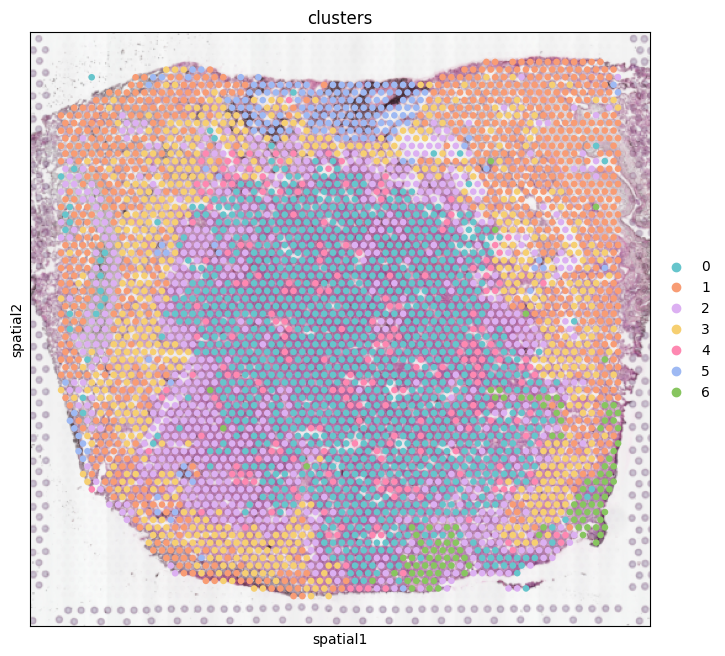

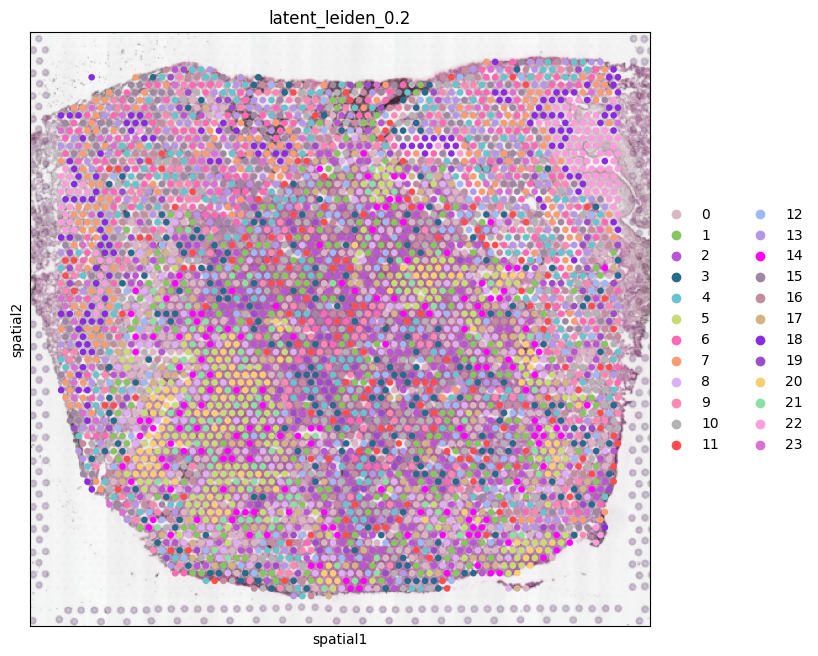

In [526]:
sc.pl.spatial(adata=model.adata[model.adata.obs[sample_key] == sample], img_key="hires", color="clusters", size=1)
sc.pl.spatial(adata=model.adata[model.adata.obs[sample_key] == sample], img_key="hires", color=latent_cluster_key, size=1)

### 4.3 Characterize Niches
### 4.3.1 Niche Composition

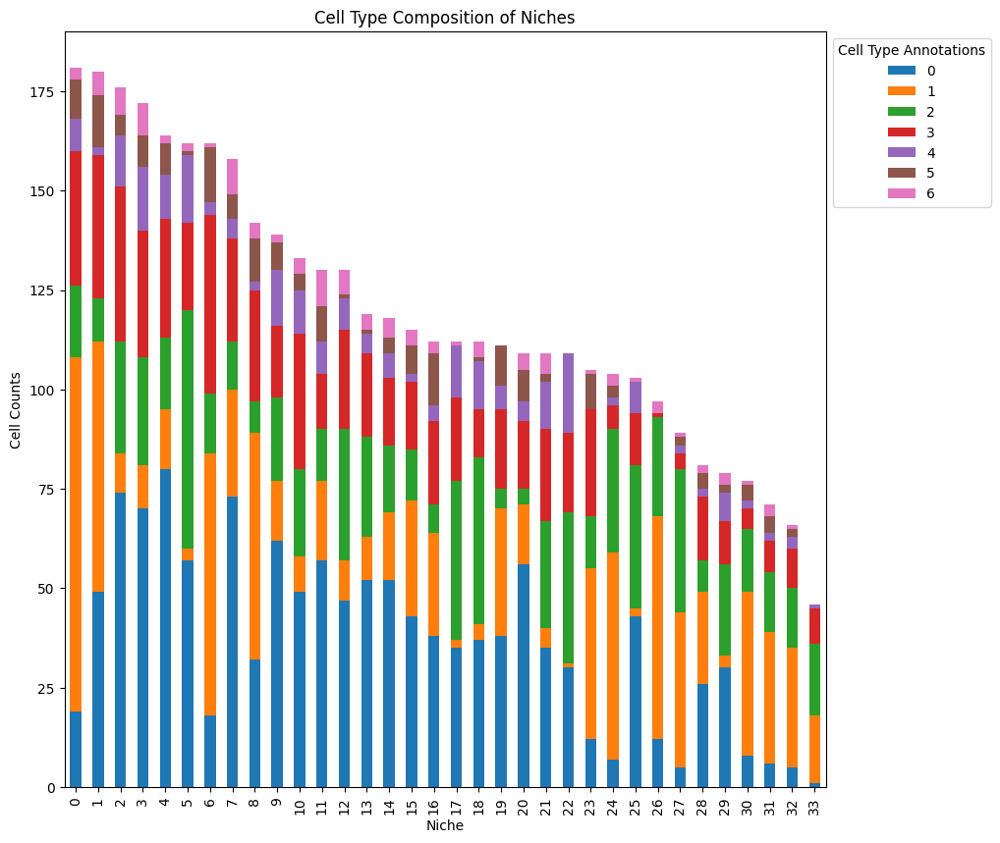

In [487]:
save_fig = True
file_path = f"{figure_folder_path}/" \
            f"res_{latent_leiden_resolution}_" \
            f"niche_composition.svg"

df_counts = (model.adata.obs.groupby([latent_cluster_key, cell_type_key])
             .size().unstack())
df_counts.plot(kind="bar", stacked=True, figsize=(10,10))
legend = plt.legend(bbox_to_anchor=(1, 1), loc="upper left", prop={'size': 10})
legend.set_title("Cell Type Annotations", prop={'size': 10})
plt.title("Cell Type Composition of Niches")
plt.xlabel("Niche")
plt.ylabel("Cell Counts")
if save_fig:
    plt.savefig(file_path,
                bbox_extra_artists=(legend,),
                bbox_inches="tight")

### 4.3.2 Differential GPs
Now we can test which GPs are differentially expressed in a niche. To this end, we will perform differential GP testing of a selected niche, e.g. niche “17” (selected_cats = ["17"]) vs all other niches (comparison_cats = "rest"). However, differential GP testing can also be performed in the following ways:

Set selected_cats = None to perform differential GP testing across all niches, as opposed to just for one specific niche.

Set comparison_cats = ["19"] to perform differential GP testing against niche “19” as opposed to against all other niches.

We choose an absolute log bayes factor threshold of 2.3 to determine strongly enriched GPs (see https://en.wikipedia.org/wiki/Bayes_factor).

In [488]:
# Check number of active GPs
active_gps = model.get_active_gps()
print(f"Number of total gene programs: {len(model.adata.uns[gp_names_key])}.")
print(f"Number of active gene programs: {len(active_gps)}.")

Number of total gene programs: 1454.
Number of active gene programs: 1154.


In [489]:
# Display example active GPs
gp_summary_df = model.get_gp_summary()
gp_summary_df[gp_summary_df["gp_active"] == True].head()

,gp_name,all_gp_idx,gp_active,active_gp_idx,n_source_genes,n_non_zero_source_genes,n_target_genes,n_non_zero_target_genes,gp_source_genes,gp_target_genes,gp_source_genes_weights,gp_target_genes_weights,gp_source_genes_importances,gp_target_genes_importances
2,S100A10_ligand_receptor_GP,2,True,0,1,1,1,1,[S100A10],[PLA2G4A],[-0.0882],[-0.0144],[0.8596],[0.1404]
4,VCL_ligand_receptor_GP,4,True,1,1,1,1,1,[VCL],[PIK3R1],[-0.0866],[-0.0019],[0.9785],[0.0215]
5,TP53_ligand_receptor_GP,5,True,2,1,1,1,1,[TP53],[AR],[0.0575],[-0.0168],[0.7744],[0.2256]
6,TGFA_ligand_receptor_GP,6,True,3,1,1,1,1,[TGFA],[PDGFRB],[-0.0106],[-0.0343],[0.2353],[0.7647]
7,TLN1_ligand_receptor_GP,7,True,4,1,1,1,1,[TLN1],[PIK3R1],[-0.0969],[0.0063],[0.9388],[0.0612]


In [490]:
# Set parameters for differential gp testing
selected_cats = ["25"]
comparison_cats = "rest"
title = f"NicheCompass Strongly Enriched Niche GPs"
log_bayes_factor_thresh = 2.3 # 2.3
save_fig = True
file_path = f"{figure_folder_path}" \
            f"/log_bayes_factor_{log_bayes_factor_thresh}" \
             "_niches_enriched_gps_heatmap.svg"

In [491]:
# Run differential gp testing
enriched_gps = model.run_differential_gp_tests(
    cat_key=latent_cluster_key,
    selected_cats=selected_cats,
    comparison_cats=comparison_cats,
    log_bayes_factor_thresh=log_bayes_factor_thresh)

In [492]:
enriched_gps

['Add-on_76_GP',
 'Add-on_63_GP',
 'Add-on_81_GP',
 'Add-on_88_GP',
 'Add-on_40_GP',
 'Add-on_42_GP',
 'ICOSLG_ligand_receptor_target_gene_GP',
 'Add-on_96_GP',
 'SDC2_ligand_receptor_GP',
 'CLEC2D_ligand_receptor_target_gene_GP',
 'Add-on_37_GP',
 'Add-on_34_GP',
 'Add-on_0_GP',
 'TNC_ligand_receptor_GP',
 'Add-on_86_GP',
 'VCAN_ligand_receptor_target_gene_GP',
 'VEGFC_ligand_receptor_GP',
 'ARF4_ligand_receptor_GP',
 'Betaine_metabolite_enzyme_sensor_GP',
 'FGF2_ligand_receptor_GP',
 'Add-on_21_GP',
 'CXCL10_ligand_receptor_GP',
 'CDH15_ligand_receptor_target_gene_GP',
 'VCL_ligand_receptor_GP',
 'Add-on_66_GP',
 'Add-on_73_GP',
 'ANGPTL4_ligand_receptor_target_gene_GP',
 'FLT3LG_ligand_receptor_target_gene_GP',
 'CD1B_ligand_receptor_target_gene_GP',
 'HLA-A_ligand_receptor_target_gene_GP',
 'Add-on_98_GP',
 'Add-on_93_GP',
 'TMEM190_ligand_receptor_target_gene_GP',
 'TSPAN5_ligand_receptor_target_gene_GP',
 'OXT_ligand_receptor_target_gene_GP',
 'Deoxyuridine_metabolite_enzyme_sens

In [493]:
# Results are stored in a df in the adata object
model.adata.uns[differential_gp_test_results_key]

,category,gene_program,p_h0,p_h1,log_bayes_factor
0,25,Add-on_76_GP,0.921187,0.078813,2.458587
1,25,Add-on_63_GP,0.918811,0.081189,2.426306
2,25,Add-on_81_GP,0.081200,0.918800,-2.426153
3,25,Add-on_88_GP,0.918800,0.081200,2.426153
4,25,Add-on_40_GP,0.918459,0.081541,2.421596
...,...,...,...,...,...
1017,25,LGALS9_ligand_receptor_GP,0.909697,0.090303,2.309944
1018,25,Add-on_33_GP,0.090363,0.909637,-2.309208
1019,25,TNC_ligand_receptor_target_gene_GP,0.090600,0.909400,-2.306331
1020,25,CCL20_ligand_receptor_target_gene_GP,0.909137,0.090863,2.303146


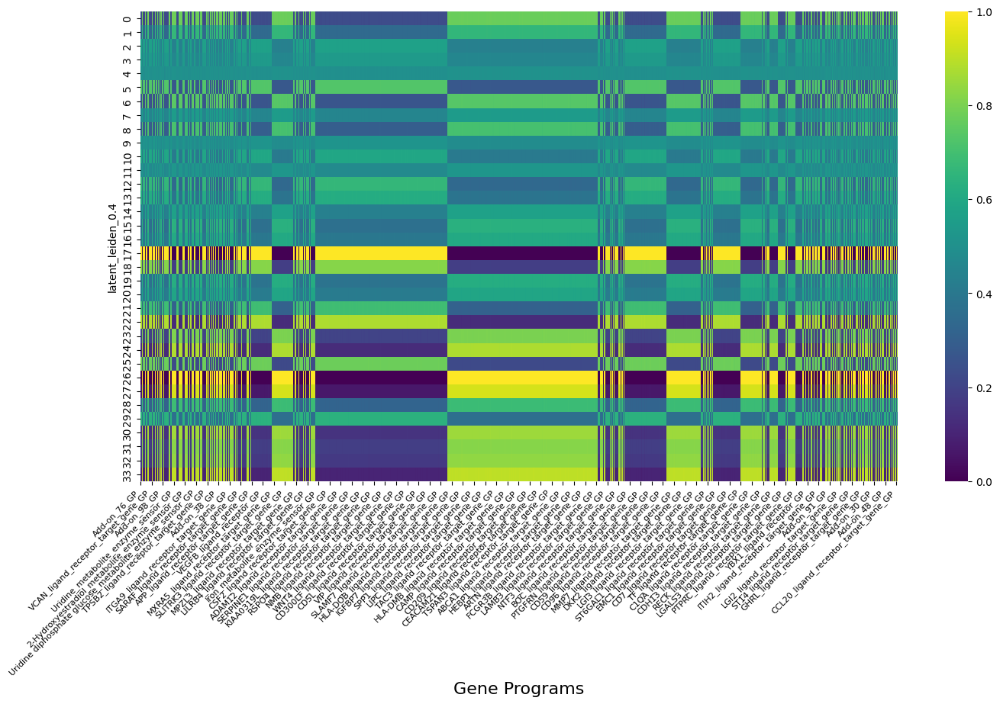

In [494]:
# Visualize GP activities of enriched GPs across niches
df = model.adata.obs[[latent_cluster_key] + enriched_gps].groupby(latent_cluster_key).mean()

scaler = MinMaxScaler()
normalized_columns = scaler.fit_transform(df)
normalized_df = pd.DataFrame(normalized_columns, columns=df.columns)
normalized_df.index = df.index

plt.figure(figsize=(16, 8))  # Set the figure size
ax = sns.heatmap(normalized_df,
            cmap='viridis',
            annot=False,
            linewidths=0)
plt.xticks(rotation=45,
           fontsize=8,
           ha="right"
          )
plt.xlabel("Gene Programs", fontsize=16)
plt.savefig(f"{figure_folder_path}/enriched_gps_heatmap.svg",
            bbox_inches="tight")

In [495]:
# Store gene program summary of enriched gene programs
save_file = True
file_path = f"{figure_folder_path}" \
            f"/log_bayes_factor_{log_bayes_factor_thresh}_" \
            "niche_enriched_gps_summary.csv"

gp_summary_cols = ["gp_name",
                   "n_source_genes",
                   "n_non_zero_source_genes",
                   "n_target_genes",
                   "n_non_zero_target_genes",
                   "gp_source_genes",
                   "gp_target_genes",
                   "gp_source_genes_importances",
                   "gp_target_genes_importances"]

enriched_gp_summary_df = gp_summary_df[gp_summary_df["gp_name"].isin(enriched_gps)]
cat_dtype = pd.CategoricalDtype(categories=enriched_gps, ordered=True)
enriched_gp_summary_df.loc[:, "gp_name"] = enriched_gp_summary_df["gp_name"].astype(cat_dtype)
enriched_gp_summary_df = enriched_gp_summary_df.sort_values(by="gp_name")
enriched_gp_summary_df = enriched_gp_summary_df[gp_summary_cols]

if save_file:
    enriched_gp_summary_df.to_csv(f"{file_path}")
else:
    display(enriched_gp_summary_df)

In [496]:
samples

[1]

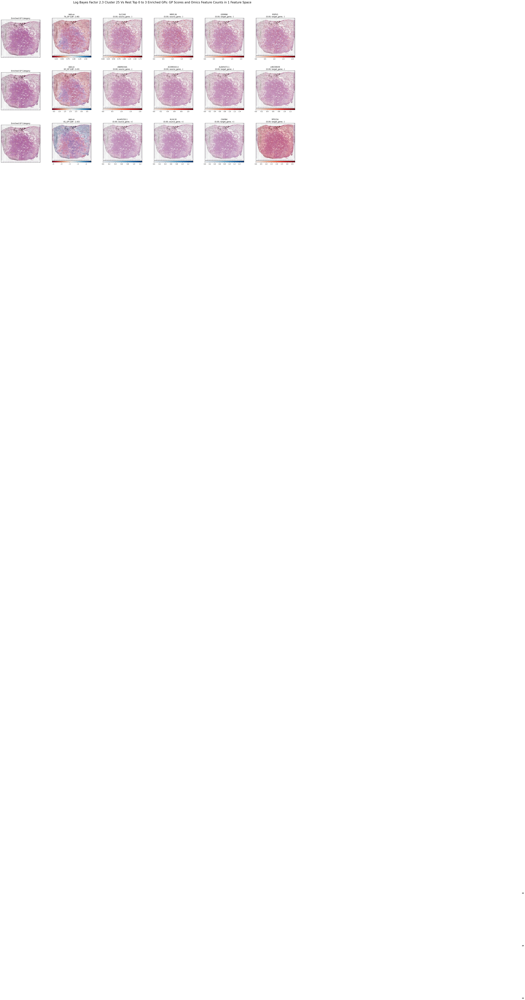

In [497]:
plot_label = f"log_bayes_factor_{log_bayes_factor_thresh}_cluster_{selected_cats[0]}_vs_rest"
save_figs = True

generate_enriched_gp_info_plots(
    plot_label=plot_label,
    model=model,
    sample_key=sample_key,
    differential_gp_test_results_key=differential_gp_test_results_key,
    cat_key=latent_cluster_key,
    cat_palette=latent_cluster_colors,
    n_top_enriched_gp_start_idx=0,
    n_top_enriched_gp_end_idx=3,
    feature_spaces=samples, # ["latent"]
    n_top_genes_per_gp=2,
    save_figs=save_figs,
    figure_folder_path=f"{figure_folder_path}/",
    spot_size=100) #spot_size

In [498]:
adata.var.loc['BACE1']

mt                           False
n_cells_by_counts              873
mean_counts               0.255922
log1p_mean_counts          0.22787
pct_dropout_by_counts    78.681319
total_counts                1048.0
log1p_total_counts        6.955593
n_cells                        872
highly_variable              False
means                     0.199714
dispersions               0.204009
dispersions_norm         -0.434744
Name: BACE1, dtype: object

### 4.3.3 Cell-cell Communication
Now we will use the inferred activity of an enriched combined interaction GP to analyze the involved intercellular interactions.

In [499]:
gp_name = "BACE1_ligand_receptor_target_gene_GP" 
#Pdgfa_ligand_receptor_target_gene_GP, Kl_ligand_receptor_target_gene_GP, Grp_ligand_receptor_target_gene_GP

In [500]:
network_df = compute_communication_gp_network(
    gp_list=[gp_name],
    model=model,
    group_key=latent_cluster_key,
    n_neighbors=n_neighbors)


In [501]:
help(visualize_communication_gp_network)

Help on function visualize_communication_gp_network in module nichecompass.utils.analysis:

visualize_communication_gp_network(adata, network_df, cat_colors, edge_type_colors: Optional[dict] = None, edge_width_scale: int = 20.0, node_size: int = 500, fontsize: int = 14, figsize: Tuple[int, int] = (18, 16), plot_legend: bool = True, save: bool = False, save_path: str = 'communication_gp_network.svg', show: bool = True, text_space: float = 1.3, connection_style='arc3, rad = 0.1', cat_key: str = 'niche', edge_attr: str = 'strength')
    Visualize a communication gp network.



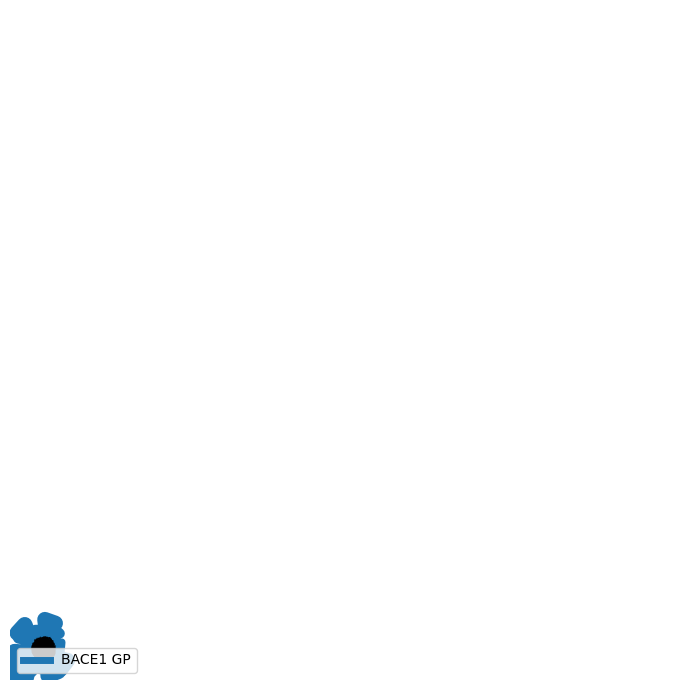

In [502]:
visualize_communication_gp_network(
    adata=model.adata,
    network_df=network_df,
    figsize=(7, 7),
    cat_colors=latent_cluster_colors,
    node_size= 5,
    edge_type_colors=["#1f77b4"], 
    cat_key=latent_cluster_key,
    save=True,
    save_path=f"{figure_folder_path}/gp_network_{gp_name}.svg",
    )

In [503]:
network_df

,source,target,strength,strength_unscaled,edge_type
0,22,17,1.00,0.009769,BACE1_ligand_receptor_target_gene_GP
1,17,17,1.00,0.009742,BACE1_ligand_receptor_target_gene_GP
2,22,22,0.65,0.006358,BACE1_ligand_receptor_target_gene_GP
3,21,5,0.56,0.005477,BACE1_ligand_receptor_target_gene_GP
4,5,17,0.55,0.005411,BACE1_ligand_receptor_target_gene_GP
...,...,...,...,...,...
455,27,27,0.01,0.000056,BACE1_ligand_receptor_target_gene_GP
456,8,31,0.01,0.000055,BACE1_ligand_receptor_target_gene_GP
457,33,32,0.01,0.000054,BACE1_ligand_receptor_target_gene_GP
458,1,16,0.01,0.000052,BACE1_ligand_receptor_target_gene_GP
